<a href="https://colab.research.google.com/github/Mohamedragih1/SUAS-ODLC/blob/main/SUAS_ODLC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Install Dependences

In [ ]:
!pip install ultralytics
!pip install easyocr

#Import Necessary Libraries

In [2]:
import pandas as pd
import numpy as np
import joblib
import easyocr
import cv2
import os
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
from ultralytics.utils.plotting import Annotator
from IPython.display import HTML
from joblib.parallel import nullcontext
from zmq.constants import NULL

#Change The Root Path To Drive

In [3]:
from google.colab import drive
drive.mount('/content/drive/')
desired_path = '/content/drive/MyDrive/Colab Data/'
os.chdir(desired_path)

Mounted at /content/drive/


#Load Our YOLOv8 and Color Classification models

In [4]:
YOLO_model = YOLO("YOLO Shape Detector/runs/detect/train/weights/best.pt")

In [5]:
COLOR_model = joblib.load('Color Classification/random_forest_model.pkl')

#Using Kmeans Model To separate Our Images to Three Clusters

In [6]:
def getKmeans(clusters, image: np.ndarray):
    datapoints = image.reshape((-1, 3)).astype(np.float32)  # It is a colored image, so each pixel has 3 features
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
    ret, label, center = cv2.kmeans(datapoints, clusters, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    # Compute the histogram of cluster labels
    label_counts = np.bincount(label.ravel())

    # Find the cluster label with the largest count (background cluster)
    background_cluster_label = np.argmax(label_counts)

    # Set the count of the background cluster to zero to find the second largest cluster
    label_counts[background_cluster_label] = 0

    # Find the second largest cluster label
    second_largest_cluster_label = np.argmax(label_counts)

    # Set the count of the second largest cluster to zero to find the third largest cluster
    label_counts[second_largest_cluster_label] = 0

    # Find the third largest cluster label
    third_largest_cluster_label = np.argmax(label_counts)

    # Create masks for the second and third largest clusters
    second_largest_cluster_mask = (label == second_largest_cluster_label).reshape(image.shape[:2])
    third_largest_cluster_mask = (label == third_largest_cluster_label).reshape(image.shape[:2])

    # Apply the masks to the original image to extract the second and third largest clusters
    second_largest_cluster_image = np.zeros_like(image)
    third_largest_cluster_image = np.zeros_like(image)

    second_largest_cluster_image[second_largest_cluster_mask] = image[second_largest_cluster_mask]
    third_largest_cluster_image[third_largest_cluster_mask] = image[third_largest_cluster_mask]

    return second_largest_cluster_image, third_largest_cluster_image


#Image Preparation Functions

#1- Image Crop Function

In [7]:
def crop(image):
  image_copy = image.copy()

  # Copy the original image onto the copy
  image_copy[:] = image
  results = YOLO_model.predict(image, conf=0.6)

  annotator = Annotator(image)
  boxes = results[0].boxes
  cropped_images = []

  for box in boxes:
    b = box.xyxy[0] # Get box coordinates
    x1, y1, x2, y2 = map(int, b) # Convert to integer coordinates
    c = box.cls
    conf = box.conf[0]

    # Crop the region defined by the bounding box
    cropped_roi = image_copy[(y1-12):(y2+12), (x1-12):(x2+12)]
    cropped_images.append(cropped_roi)

    annotator.box_label(b, f'{YOLO_model.names[int(c)]} {conf:.2f}')

  # Display the image with the drawn bounding boxes
  cv2_imshow(image)
  print()

  return cropped_images

#2-color Calculation Function

In [8]:
def get_color(cropped_image):

  shape_image, letter_image = getKmeans(3, cropped_image)
  print()

  shape_mask = np.any(shape_image != [0, 0, 0], axis=-1)
  letter_mask = np.any(letter_image != [0, 0, 0], axis=-1)
  # Extract the non-black pixels
  shape_pixels = shape_image[shape_mask]
  letter_pixels = letter_image[letter_mask]

  if len(shape_pixels) > 0:
    # Calculate the average color of non-black pixels
    shape_color = np.mean(shape_pixels, axis=0).astype(int)
  else:
    shape_color = None

  if len(letter_pixels) > 0:
    # Calculate the average color of non-black pixels
    letter_color = np.mean(letter_pixels, axis=0).astype(int)
  else:
    letter_color = None

  return shape_color[::-1], letter_color[::-1]  # Return in RGB format


#3-Letter Extraction Function

In [9]:
def get_letter(cropped_image):
  list = []
  counts = {}
  _, mask = getKmeans(3, cropped_image)
  non_black_pixels_mask = np.any(mask != [0, 0, 0], axis=-1)

  # Extract the non-black pixels
  mask[non_black_pixels_mask] = [255, 255, 255]
  mask = cv2.bitwise_not(mask)
  gray = np.full_like(mask, 128, dtype=np.uint8)
  mask = cv2.bitwise_and(mask,gray)
  accuracy = 0
  count = 0
  while True:
    angle = 15
    height, width = mask.shape[:2]
    center = (width // 2, height // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    mask = cv2.warpAffine(mask, rotation_matrix, (width, height))
    reader = easyocr.Reader(['en'])
    result = reader.readtext(mask)
    count = count + 1
    if count > 24:
      break
    if result == []:
      continue
    list.append(result[0][1])
    accuracy = result[0][2]
  for element in list:
    if element in counts:
      counts[element] += 1
    else:
      counts[element] = 1

  # Find the most frequently appended element
  if counts == {}:
    return 'NULL'
  most_frequent_element = max(counts, key=counts.get)

  return most_frequent_element


#Testing

#Inference


0: 640x640 1 heptagon, 75.6ms
Speed: 18.6ms preprocess, 75.6ms inference, 48.4ms postprocess per image at shape (1, 3, 640, 640)


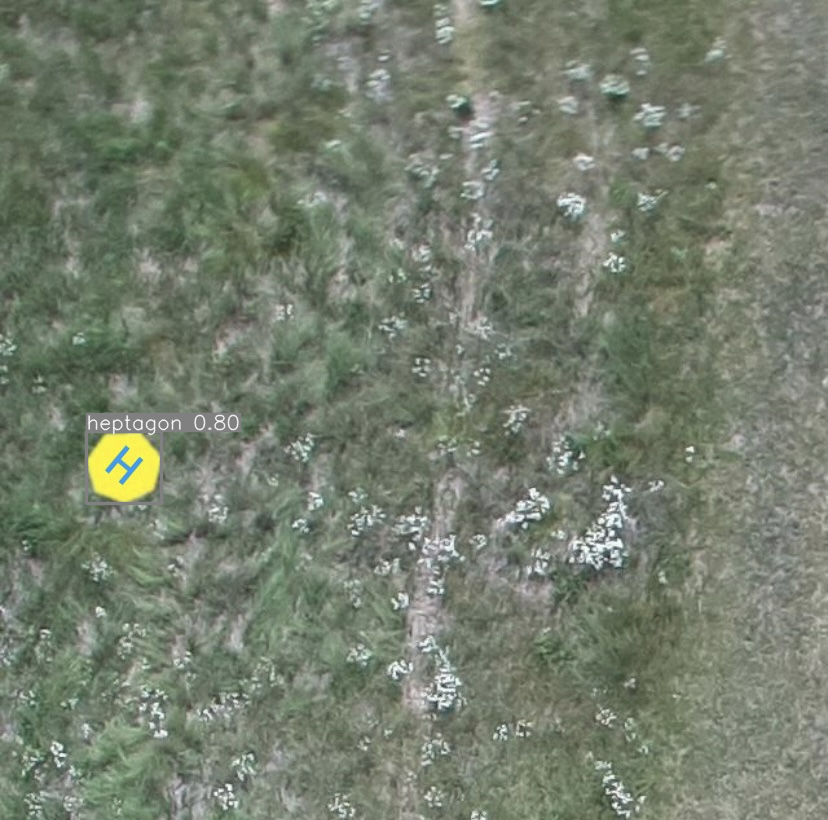

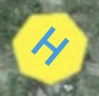



[243 238  89]




The predicted color of the Shape is Yellow

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete the letter is H

[129 149 132]



The predicted color of the Letter is Gray


0: 640x640 1 hexagon, 97.6ms
Speed: 4.2ms preprocess, 97.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


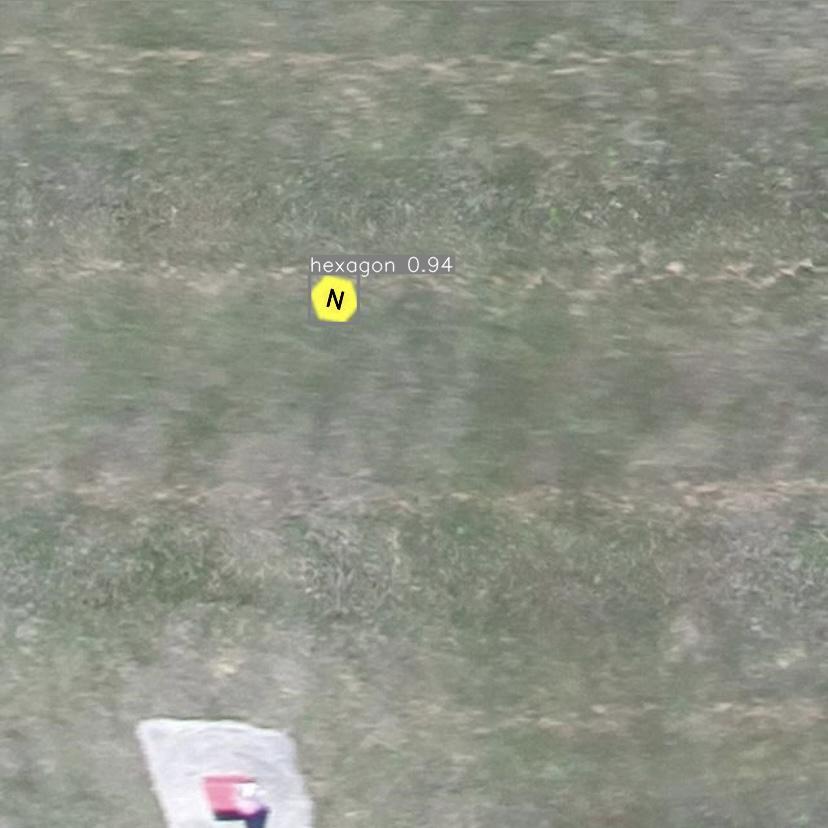

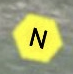



[242 242  92]




The predicted color of the Shape is Yellow

 the letter is N

[22 18  1]



The predicted color of the Letter is Brown


0: 640x640 1 hexagon, 97.5ms
Speed: 12.4ms preprocess, 97.5ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


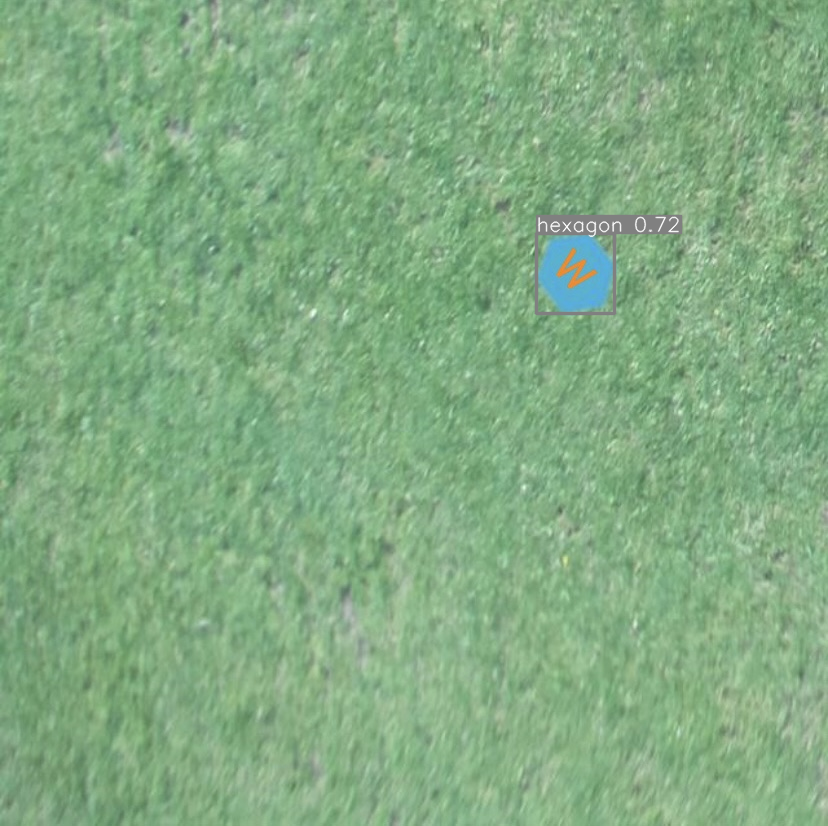

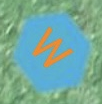



[ 95 174 206]




The predicted color of the Shape is Blue

 the letter is M

[212 144  73]



The predicted color of the Letter is Orange


0: 640x640 1 semicircle, 97.7ms
Speed: 4.0ms preprocess, 97.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


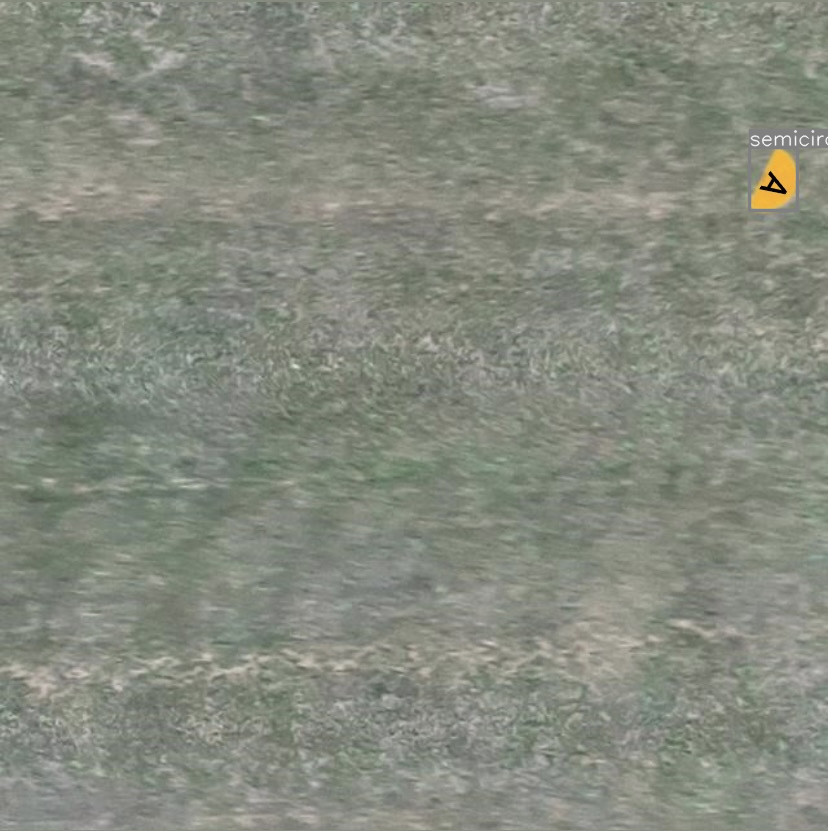

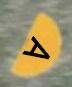



[229 179  78]




The predicted color of the Shape is Orange

 the letter is A

[25 11  1]



The predicted color of the Letter is Brown


0: 640x640 1 hexagon, 97.8ms
Speed: 2.0ms preprocess, 97.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


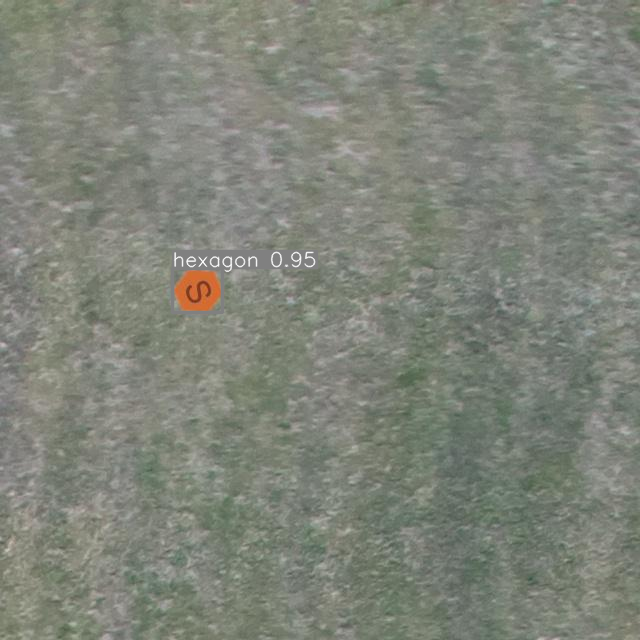

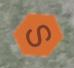



[203 110  58]




The predicted color of the Shape is Orange

 the letter is S

[143  63  29]



The predicted color of the Letter is Brown


0: 640x640 1 pentagon, 99.3ms
Speed: 2.8ms preprocess, 99.3ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


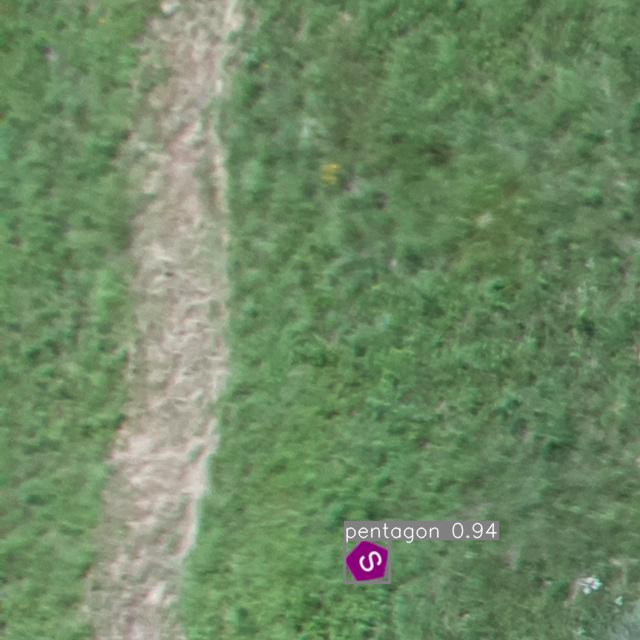

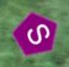



[137  18 120]




The predicted color of the Shape is Purple

 the letter is S

[234 185 230]



The predicted color of the Letter is Pink


0: 640x640 1 semicircle, 102.0ms
Speed: 10.4ms preprocess, 102.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


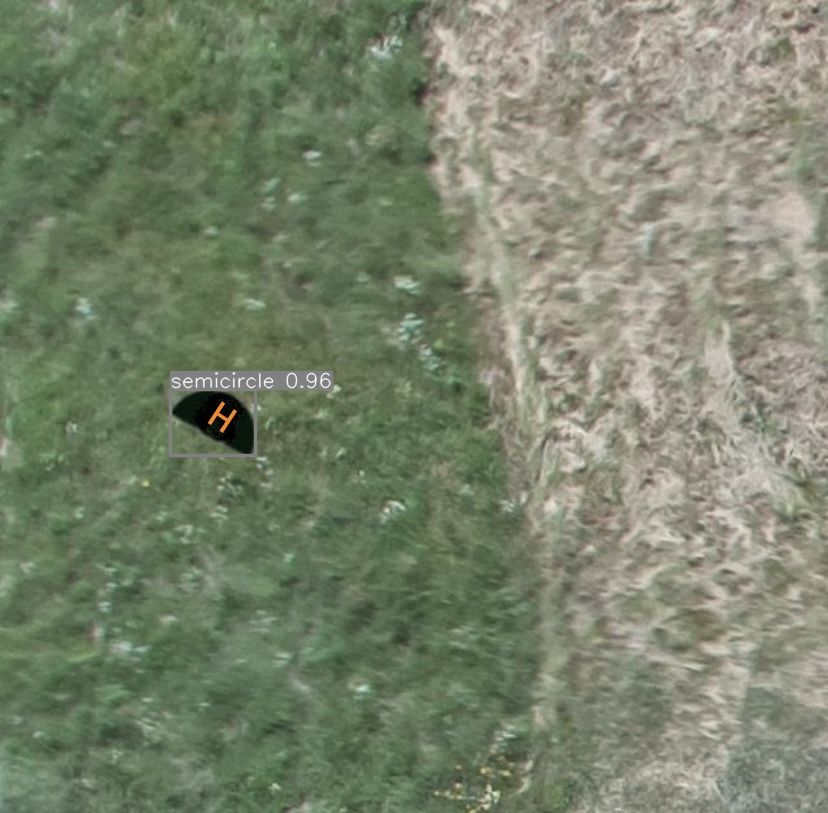

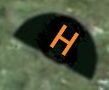



[13 18 11]




The predicted color of the Shape is Black

 the letter is H

[187 151 101]



The predicted color of the Letter is Gray


0: 640x640 1 octagon, 100.7ms
Speed: 4.7ms preprocess, 100.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


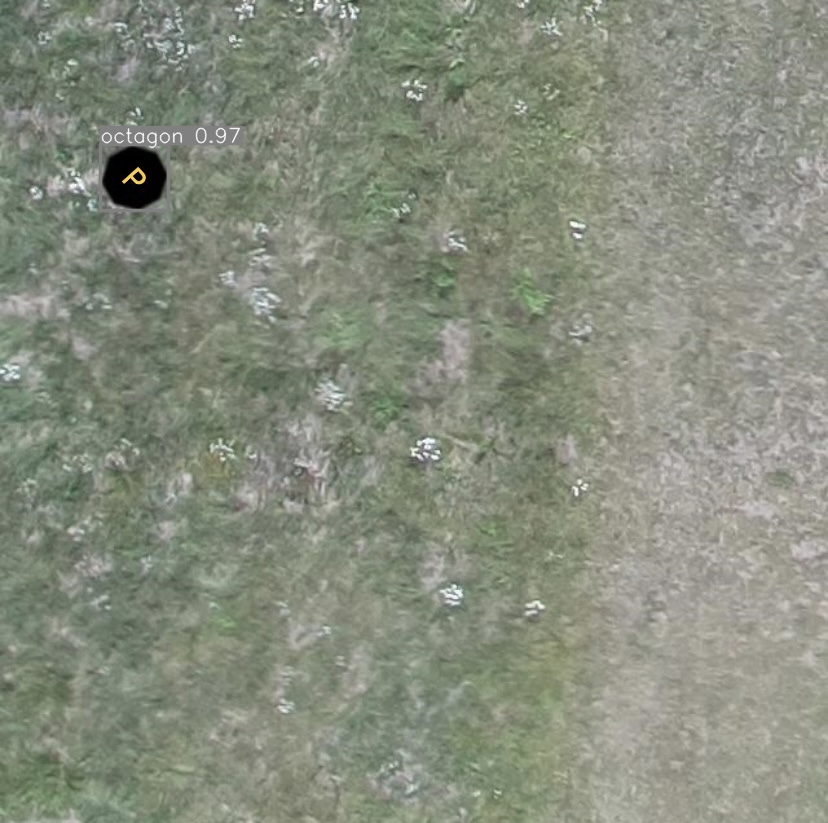

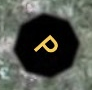



[7 6 6]




The predicted color of the Shape is Black

 the letter is P

[162 164 149]



The predicted color of the Letter is Gray


0: 640x640 1 triangle, 100.3ms
Speed: 4.5ms preprocess, 100.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


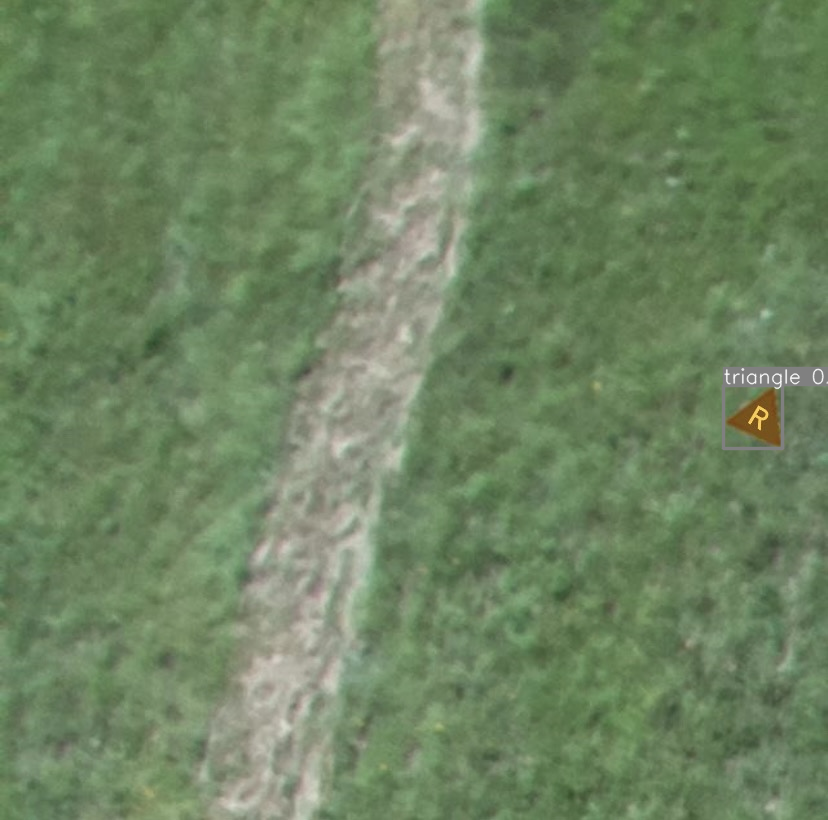

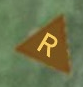



[118  84  32]




The predicted color of the Shape is Brown

 the letter is R

[234 195 100]



The predicted color of the Letter is Orange


0: 640x640 1 cross, 98.5ms
Speed: 4.5ms preprocess, 98.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


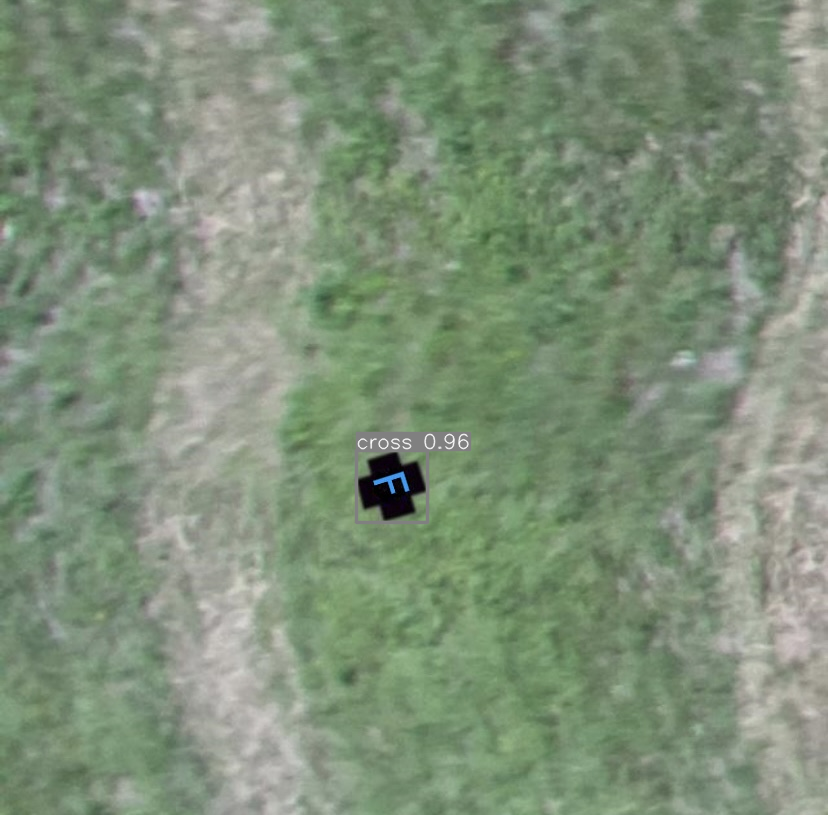

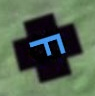



[13 11 17]




The predicted color of the Shape is Black

 the letter is J

[ 74 142 214]



The predicted color of the Letter is Blue


0: 640x640 1 quartercircle, 97.3ms
Speed: 9.6ms preprocess, 97.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


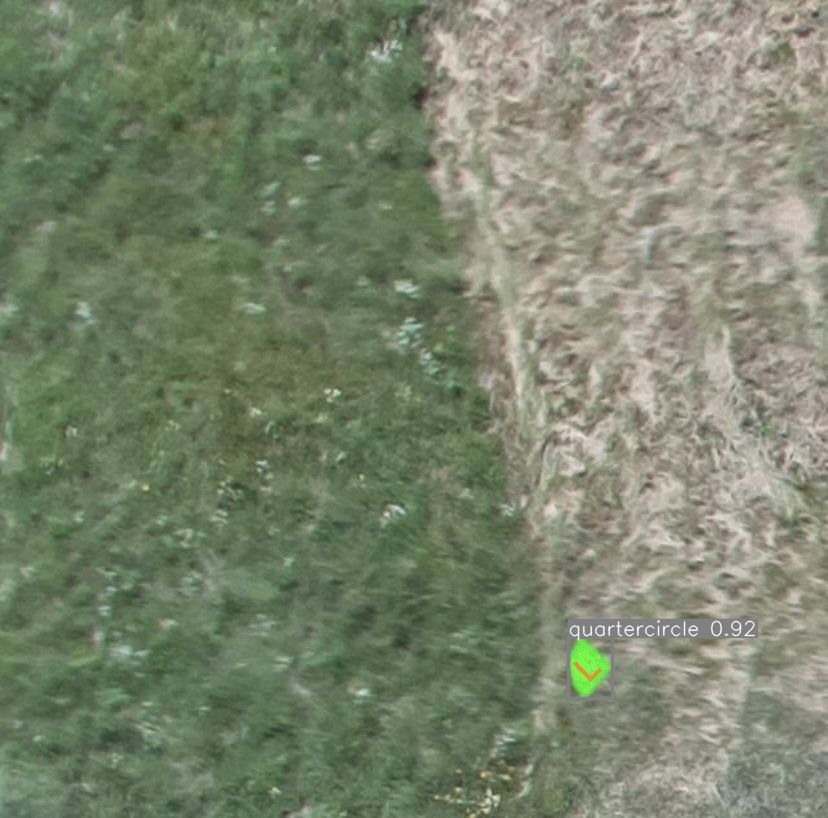

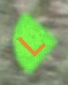



[152 155 126]




The predicted color of the Shape is Gray

 the letter is NULL

[120 227  80]



The predicted color of the Letter is Green


0: 640x640 1 octagon, 103.5ms
Speed: 4.8ms preprocess, 103.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


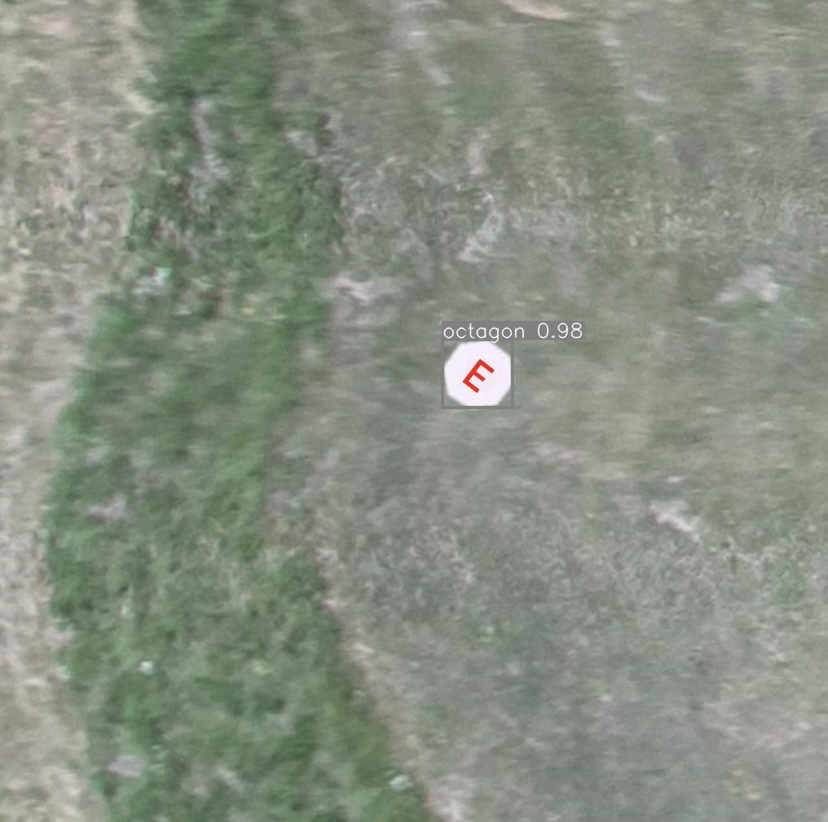

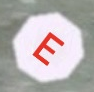



[242 233 243]




The predicted color of the Shape is White

 the letter is E

[212  64  55]



The predicted color of the Letter is Red


0: 640x640 1 square, 104.5ms
Speed: 5.4ms preprocess, 104.5ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


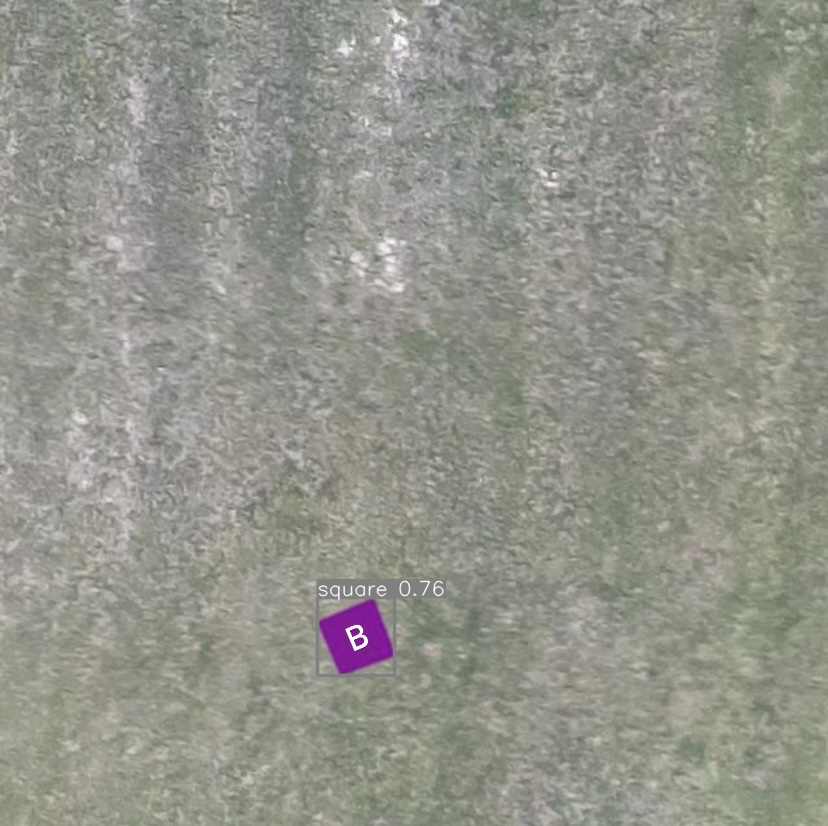

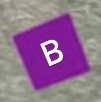



[126  32 144]




The predicted color of the Shape is Purple

 the letter is 6)

[252 237 253]



The predicted color of the Letter is White


0: 640x640 1 square, 99.6ms
Speed: 6.7ms preprocess, 99.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


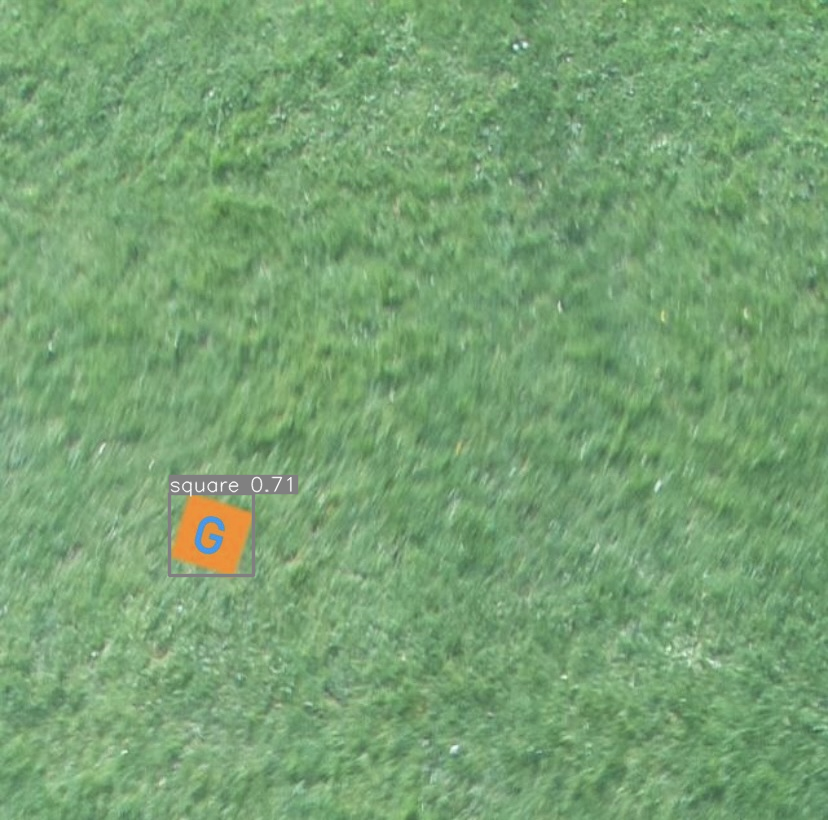

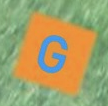



[227 147  65]




The predicted color of the Shape is Orange

 the letter is ()

[ 81 149 215]



The predicted color of the Letter is Blue


0: 640x640 1 hexagon, 98.6ms
Speed: 2.1ms preprocess, 98.6ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)


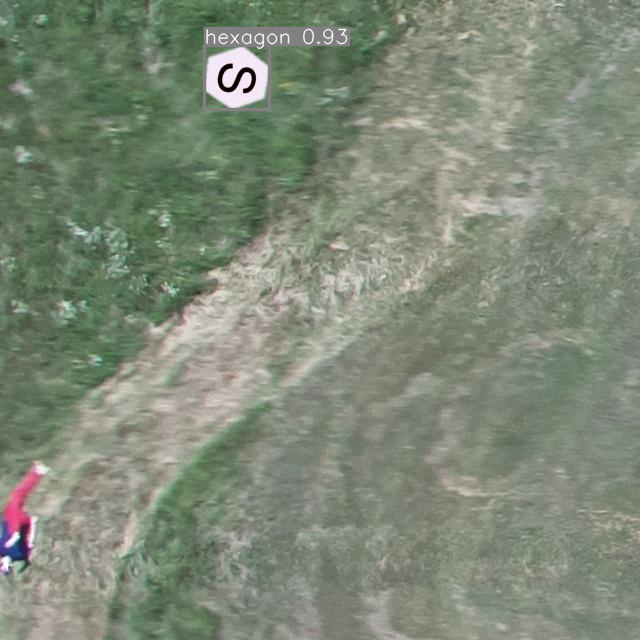

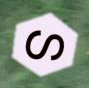



[237 226 238]




The predicted color of the Shape is White

 the letter is S

[17  6  9]



The predicted color of the Letter is Black


0: 640x640 1 circle, 97.6ms
Speed: 4.2ms preprocess, 97.6ms inference, 12.4ms postprocess per image at shape (1, 3, 640, 640)


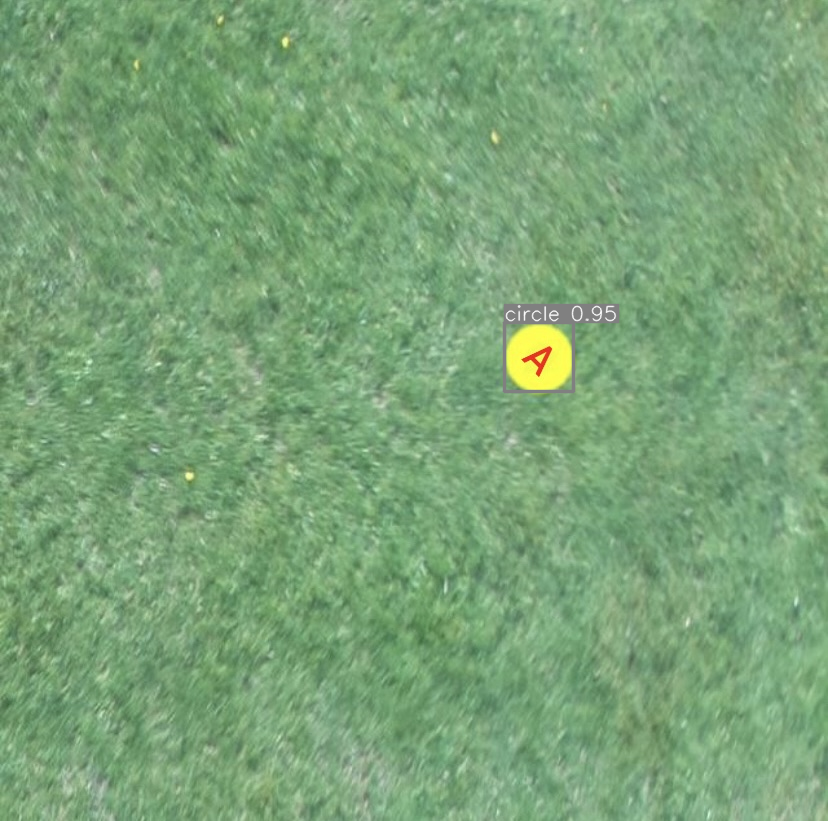

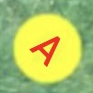



[245 247  88]




The predicted color of the Shape is Yellow

 the letter is A

[216  74  28]



The predicted color of the Letter is Red


0: 640x640 1 square, 98.2ms
Speed: 2.0ms preprocess, 98.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


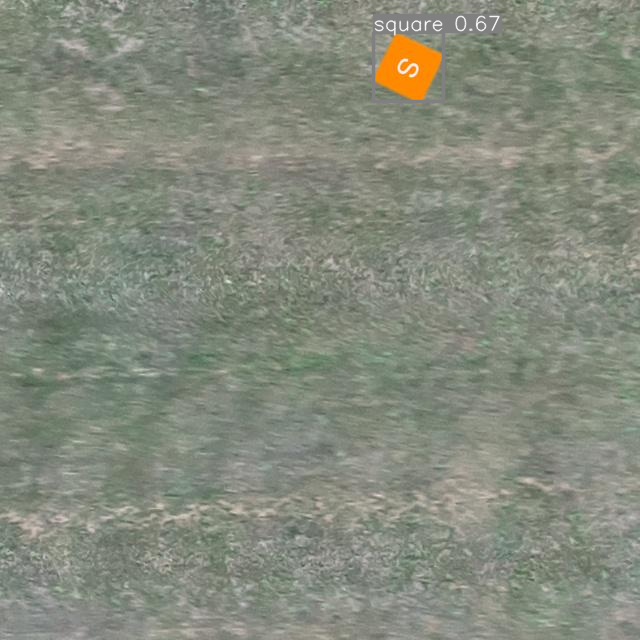

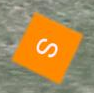



[246 138  11]




The predicted color of the Shape is Orange

 the letter is S

[247 211 177]



The predicted color of the Letter is Yellow


0: 640x640 1 square, 106.7ms
Speed: 4.1ms preprocess, 106.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


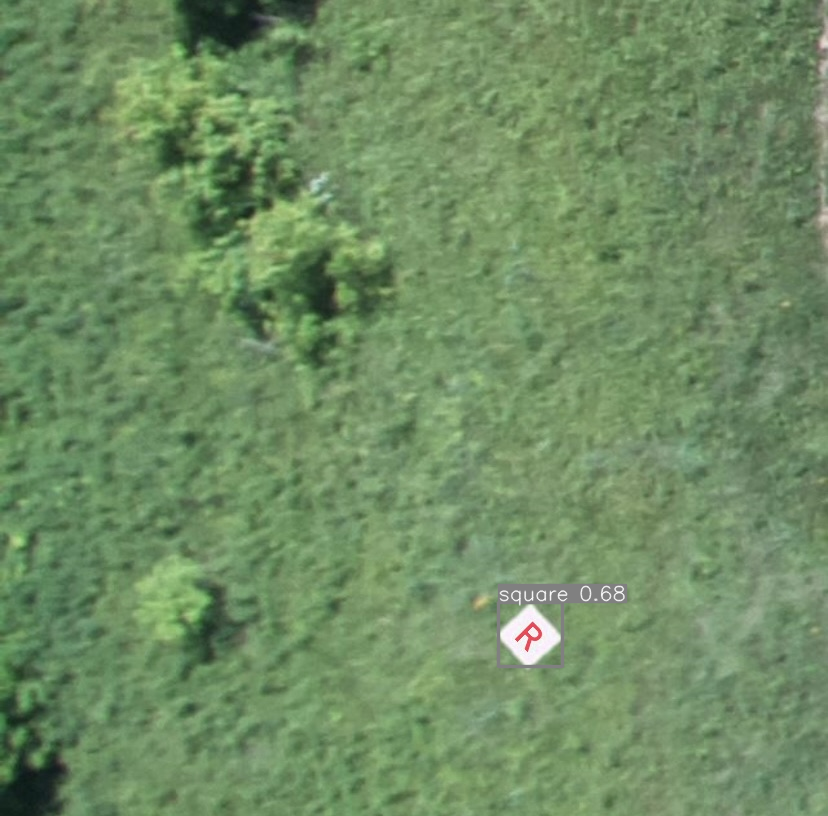

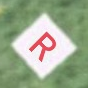



[241 236 237]




The predicted color of the Shape is White

 the letter is R

[213  90 102]



The predicted color of the Letter is Pink


0: 640x640 1 pentagon, 103.3ms
Speed: 1.9ms preprocess, 103.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


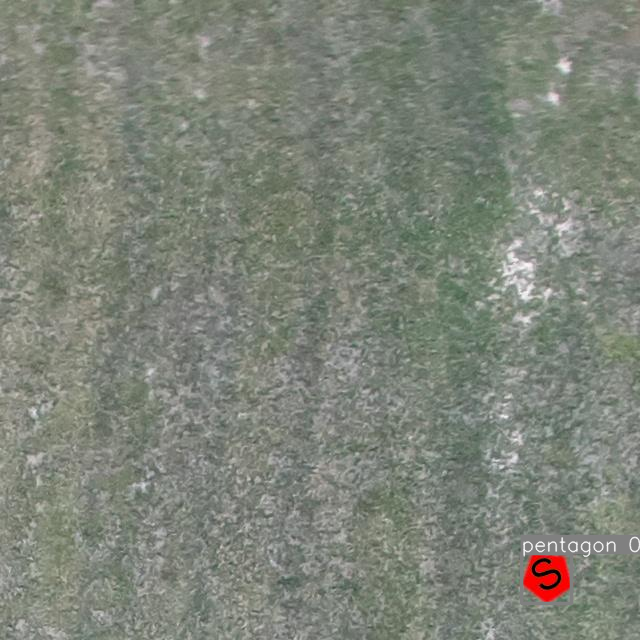

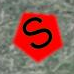



[230  17  15]




The predicted color of the Shape is Red

 the letter is S

[46  7  3]



The predicted color of the Letter is Black


0: 640x640 1 cross, 97.7ms
Speed: 4.5ms preprocess, 97.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


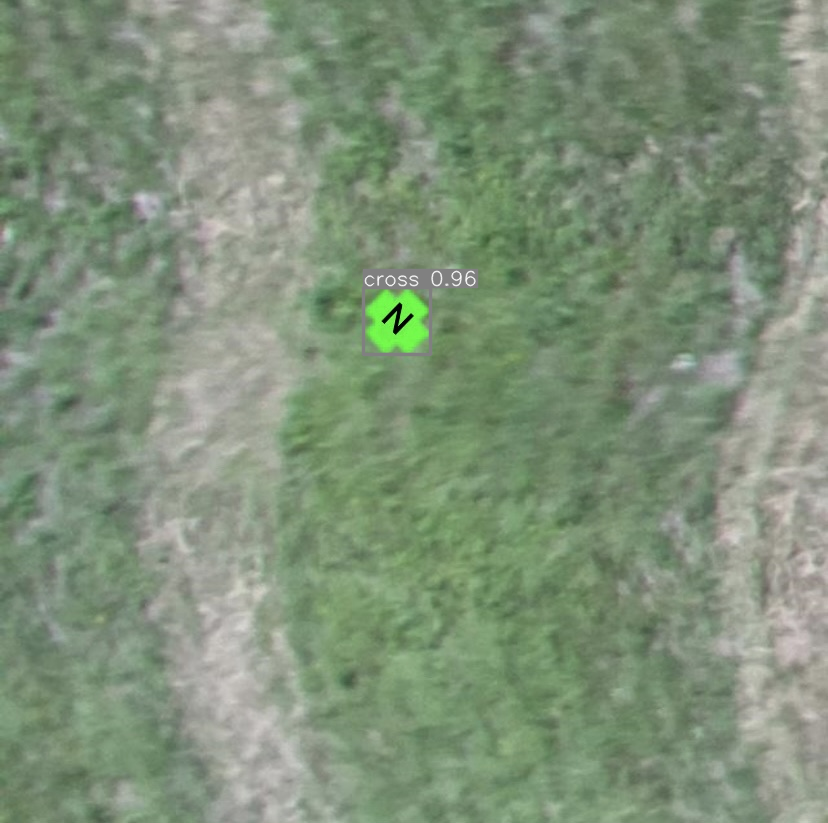

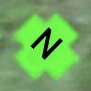



[116 237  80]




The predicted color of the Shape is Green

 the letter is N

[ 3 22  1]



The predicted color of the Letter is Black



In [10]:
for i in range(1,21):
  image = cv2.imread(f'test imgs/image{i}.jpg')
  cropped_images = crop(image)
  for cropped_image in cropped_images:
    cv2_imshow(cropped_image)
    print()
    shape_color, letter_color = get_color(cropped_image)
    print(shape_color)
    print()
    html_color = f'<div style="background-color: rgb({shape_color[0]}, {shape_color[1]}, {shape_color[2]}); width: 13px; height: 13px;"></div>'
    display(HTML(html_color))
    print()
    print(f'The predicted color of the Shape is {COLOR_model.predict([shape_color])[0]}')
    print()
    letter = get_letter(cropped_image)
    print(f' the letter is {letter}')
    print()
    html_color = f'<div style="background-color: rgb({letter_color[0]}, {letter_color[1]}, {letter_color[2]}); width: 13px; height: 13px;"></div>'
    print(letter_color)
    display(HTML(html_color))
    print()
    print(f'The predicted color of the Letter is {COLOR_model.predict([letter_color])[0]}')
    print()

#Evaluation on the 20 samples:
#1-YOLO detection 100%
#  2-                            Shape color detection 95%
#    3-                          Letter detection 70%
#      4-                        Letter color detection 70%
